## ***Clean GPU***

In [ ]:
import gc
gc.collect()
torch.cuda.empty_cache()

## ***Packages***

In [ ]:
import torch
import torch.nn as nn 
import torch.optim as optim 
from torchvision import datasets 
from torchvision import transforms
from torch.utils.data import Subset, DataLoader
from torch.utils.data import Dataset # to custom class dataset
from torchvision.io import read_image # ?
import torch.nn.functional as F

import matplotlib.pyplot as plt
import numpy as np
import os
import cv2
from PIL import Image
import random
import datetime
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold

In [ ]:
device = (torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu'))
print(f"Training on device {device}.")

Training on device cuda.


## ***Build Dataset***

In [ ]:
my_transform = transforms.Compose([
                                   transforms.Resize((256, 256)),
                                   transforms.ToTensor()
                                  ])

In [ ]:
path_image_cleaned = "/content/drive/MyDrive/Colab Notebooks/UTEC - IA/data/project6/train_cleaned"
path_image_train = "/content/drive/MyDrive/Colab Notebooks/UTEC - IA/data/project6/train"
path_image_test = "/content/drive/MyDrive/Colab Notebooks/UTEC - IA/data/project6/test"
path_models = "/content/drive/MyDrive/Colab Notebooks/UTEC - IA/models/"

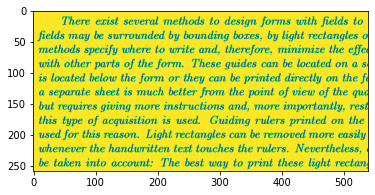

In [ ]:
img = read_image(path_image_cleaned+"/2.png")
plt.imshow(img.squeeze())

In [ ]:
def load_images_from_folder(folder, my_transform):
    data = []
    for f in sorted(os.listdir(folder + '/')):
        img = Image.open(folder + '/' + f)
        img = my_transform(img)
        img = img.squeeze()
        data.append(img.type(torch.float32))
    return data

In [ ]:
data_cleaned = load_images_from_folder(path_image_cleaned, my_transform)
data_train = load_images_from_folder(path_image_train, my_transform)
data_test = load_images_from_folder(path_image_test, my_transform)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(data_train, data_cleaned, test_size=0.30, random_state=42)

In [ ]:
tensor_cleaned_t = torch.stack(y_train)
tensor_train_t = torch.stack(X_train)
tensor_cleaned_val = torch.stack(y_test)
tensor_train_val = torch.stack(X_test)
#tensor_cleaned = torch.stack(data_cleaned)
#tensor_train = torch.stack(data_train)
tensor_test = torch.stack(data_test)

In [ ]:
data_cleaned[0].shape

torch.Size([256, 256])

In [ ]:
def check_size(data_file):
  minx, miny, maxx, maxy = 1000, 1000, 0, 0
  for img in data_file:
    minx = min(minx, img.shape[0])
    miny = min(miny, img.shape[1])
    maxx = max(maxx, img.shape[0])
    maxy = max(maxy, img.shape[1])
  print(minx,miny,maxx,maxy)

In [ ]:
index= np.arange(0,tensor_train_t.shape[0])
torch_index = torch.from_numpy(index)
torch_index
#tensor_train.shape

tensor([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35,
        36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53,
        54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71,
        72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89,
        90, 91, 92, 93, 94, 95, 96, 97, 98, 99])

In [ ]:
#train_loader = DataLoader(data_train, shuffle=False, batch_size= 4)
#cleaned_loader = DataLoader(data_cleaned, shuffle=False, batch_size= 4)
index_loader = DataLoader(torch_index, shuffle=True, batch_size= 4)

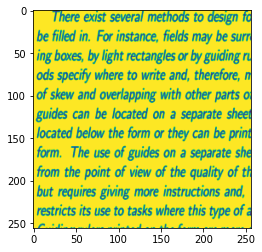

In [ ]:
plt.imshow(data_cleaned[0])

## ***Training & Validate Function Convolution***

In [ ]:
def training_loop_conv(n_epochs, optimizer, model, loss_fn, index_loader, t_train, t_cleaned, t_val_x, t_val_y, t_test, k_value = 2):
  errors = []
  validation = []
  tran1_tmp = transforms.ToPILImage()
  for epoch in range(1, n_epochs + 1):
    loss_train = 0.0
    
    for ind in index_loader:
      
      imgs = t_train[ind]
      img_out = imgs[0]
      imgs = imgs.view(imgs.shape[0],1,imgs.shape[1], imgs.shape[2]).to(device)
      
      out = t_cleaned[ind]
      out = out.view(out.shape[0],1,out.shape[1], out.shape[2]).to(device)

      outputs = model(imgs)
      #print(outputs.shape)
      #print(imgs.shape)
      loss = loss_fn(outputs, out)

      optimizer.zero_grad()
      loss.backward()
      optimizer.step()

      loss_train += loss.item()

    if epoch == 1 or epoch % 10 == 0:
      print('{} Epoch {}, Training loss {}'.format( datetime.datetime.now(), epoch, 
                                                   loss_train / (t_train.shape[0])))  
      errors.append(loss_train / (t_train.shape[0]))
      out_conv = outputs[0]
      #print(out_conv.shape)
      out_conv = out_conv.view(out_conv.shape[1], out_conv.shape[2]).to("cpu")
      
      #val_k = validate_conv(model, t_val_x, t_val_y, k_value)
      #validation.append(val_k)
      display(tran1_tmp(img_out))
      display(tran1_tmp(out_conv))
  return errors, validation

In [ ]:
def validate_conv(model, train, test, k_value):
  
  error1 = 0
  cont = 0
  with torch.no_grad():
    for img_conv, val_img in zip(train, test):
      img_conv = img_conv.view(1,1,img_conv.shape[0], img_conv.shape[1]).to(device)
      val_img = val_img.view(1,1,val_img.shape[0], val_img.shape[1]).to(device)
      out_conv = model(img_conv)
      error1 += torch.sqrt(torch.sum(torch.pow(val_img - out_conv, 2)))
      cont += 1
  
  print("Validation error  k = {}: {:.2f}".format(k_value, error1 * 1.0 / cont))
  return error1 * 1.0 / cont

## ***Model Convolution***

In [ ]:
class AutoencoderConv(nn.Module):
    def __init__(self):
        super(AutoencoderConv, self).__init__()
          
        self.enc_layer1 = nn.Conv2d(1, 64, 3, padding=1)  
        self.enc_layer2 = nn.Conv2d(64, 32, 3, padding=1)
        self.enc_layer3 = nn.Conv2d(32, 16, 3, padding=1)

        self.batch1 = nn.BatchNorm2d(64)
        self.batch2 = nn.BatchNorm2d(32)
        self.batch3 = nn.BatchNorm2d(16)

        
        self.pool = nn.MaxPool2d(2, 2)
        self.out_conv = nn.Conv2d(128, 1, kernel_size=3, padding=1)
        
        self.dec_layer1 = nn.ConvTranspose2d(16, 32, 2, stride=2)
        self.dec_layer2 = nn.ConvTranspose2d(32, 64, 2, stride=2)
        self.dec_layer3 = nn.ConvTranspose2d(64, 128, 2, stride=2)
        

    def forward(self, out):
        
        out = self.batch1(F.relu(self.enc_layer1(out)))
        out = self.pool(out)
        out = self.batch2(F.relu(self.enc_layer2(out)))
        out = self.pool(out)
        out = self.batch3(F.relu(self.enc_layer3(out)))
        out = self.pool(out)


        out = self.batch2(F.relu(self.dec_layer1(out)))
        out = self.batch1(F.relu(self.dec_layer2(out)))
        out = F.relu(self.dec_layer3(out))
        out = self.out_conv(out)
        out = torch.sigmoid(out)

        return out

In [ ]:
class AutoencoderConv3(nn.Module):
    def __init__(self):
        super(AutoencoderConv3, self).__init__()
          
        self.enc_layer1 = nn.Conv2d(1, 128, 3, padding=1)  
        self.enc_layer2 = nn.Conv2d(128, 64, 3, padding=1)
        self.enc_layer3 = nn.Conv2d(64, 32, 3, padding=1)

        self.batch1 = nn.BatchNorm2d(128)
        self.batch2 = nn.BatchNorm2d(64)
        self.batch3 = nn.BatchNorm2d(32)

        
        self.pool = nn.MaxPool2d(2, 2)
        self.out_conv = nn.Conv2d(256, 1, kernel_size=3, padding=1)
        
        self.dec_layer1 = nn.ConvTranspose2d(32, 64, 2, stride=2)
        self.dec_layer2 = nn.ConvTranspose2d(64, 128, 2, stride=2)
        self.dec_layer3 = nn.ConvTranspose2d(128, 256, 2, stride=2)
        

    def forward(self, out):
        
        out = self.batch1(F.relu(self.enc_layer1(out)))
        out = self.pool(out)
        out = self.batch2(F.relu(self.enc_layer2(out)))
        out = self.pool(out)
        out = self.batch3(F.relu(self.enc_layer3(out)))
        out = self.pool(out)


        out = self.batch2(F.relu(self.dec_layer1(out)))
        out = self.batch1(F.relu(self.dec_layer2(out)))
        out = F.relu(self.dec_layer3(out))
        out = self.out_conv(out)
        out = torch.sigmoid(out)

        return out

## ***Training Model Convolutional***

In [ ]:
model_conv = AutoencoderConv2().to(device)
optimizer_conv = optim.Adam(model_conv.parameters(), lr=1e-3)
loss_fn_conv = nn.MSELoss()

In [ ]:
torch.save(model_conv.state_dict(), path_models + "cnn1.pt")

In [ ]:
#model
weights = sum(p.numel() for p in model_conv.parameters())
weights/10**6

0.141825

In [ ]:
model_conv

AutoencoderConv2(
  (enc_layer1): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (enc_layer2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (enc_layer3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (batch1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (batch2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (batch3): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (out_conv): Conv2d(128, 1, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (dec_layer1): ConvTranspose2d(64, 64, kernel_size=(2, 2), stride=(2, 2))
  (dec_layer2): ConvTranspose2d(64, 64, kernel_size=(2, 2), stride=(2, 2))
  (dec_layer3): ConvTranspose2d(64, 128, kernel_size=(2, 2), stride=(2, 2))
)

2021-08-04 20:23:42.547648 Epoch 1, Training loss 0.014696256071329118


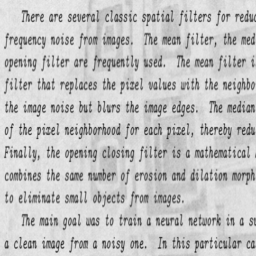

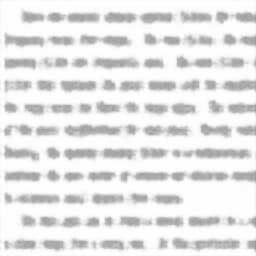

2021-08-04 20:23:48.329604 Epoch 10, Training loss 0.0028185225557535885


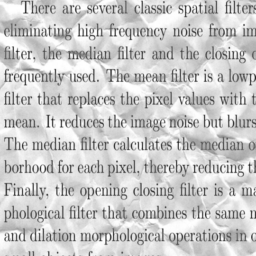

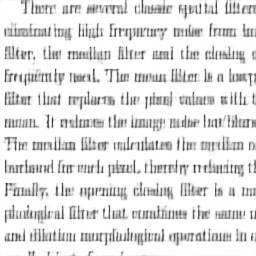

2021-08-04 20:23:54.762961 Epoch 20, Training loss 0.0017733666952699423


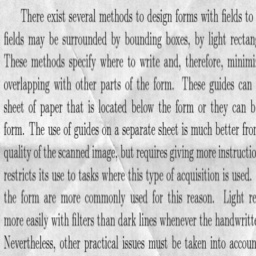

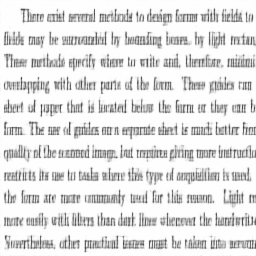

2021-08-04 20:24:01.175191 Epoch 30, Training loss 0.0014735485753044487


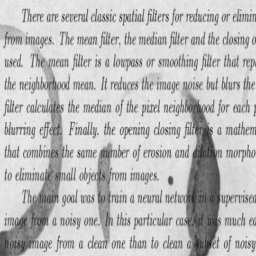

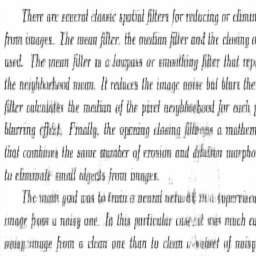

2021-08-04 20:24:07.601079 Epoch 40, Training loss 0.0013072625268250703


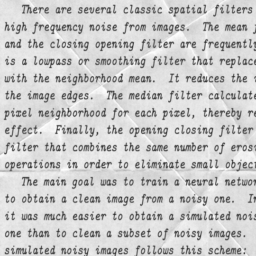

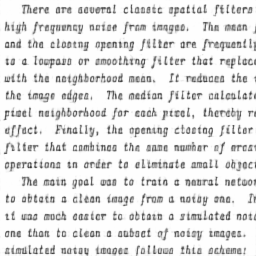

2021-08-04 20:24:14.018700 Epoch 50, Training loss 0.0011827464355155825


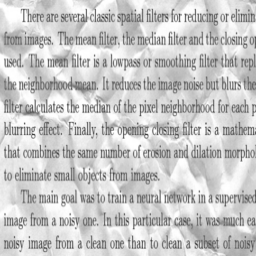

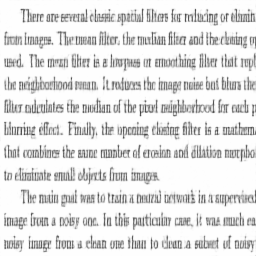

2021-08-04 20:24:20.426563 Epoch 60, Training loss 0.0010932547668926417


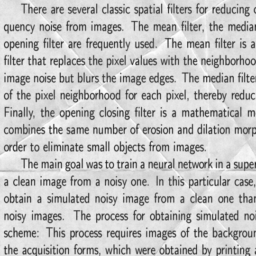

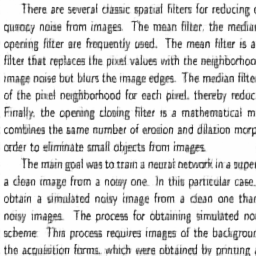

2021-08-04 20:24:26.845716 Epoch 70, Training loss 0.0010112895118072629


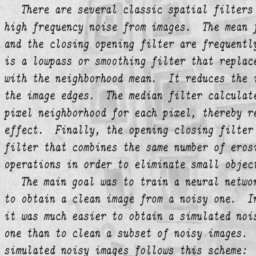

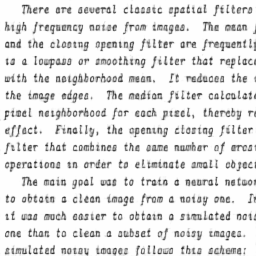

2021-08-04 20:24:33.251660 Epoch 80, Training loss 0.001010598405264318


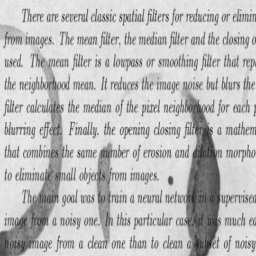

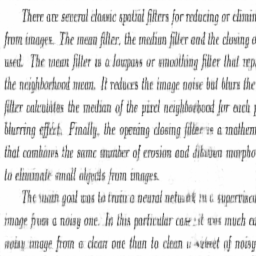

2021-08-04 20:24:39.683053 Epoch 90, Training loss 0.0009527277760207653


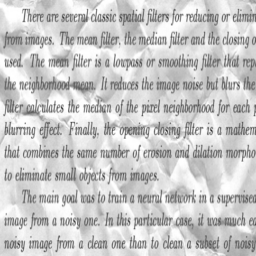

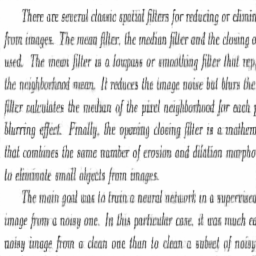

2021-08-04 20:24:46.086525 Epoch 100, Training loss 0.0009376573795452713


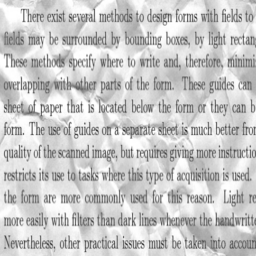

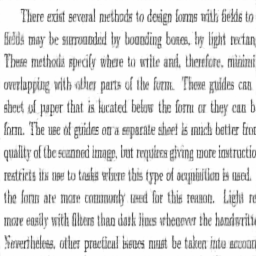

2021-08-04 20:24:52.505895 Epoch 110, Training loss 0.0008777964045293629


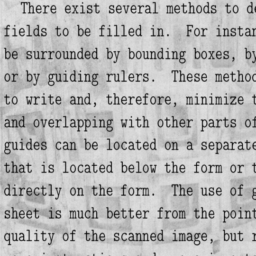

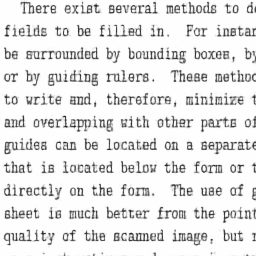

2021-08-04 20:24:58.931053 Epoch 120, Training loss 0.0008644526964053512


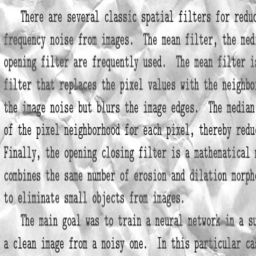

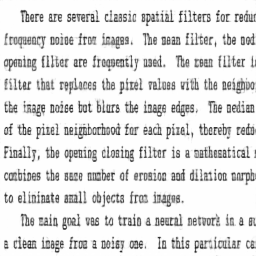

2021-08-04 20:25:05.362780 Epoch 130, Training loss 0.0008551609609276056


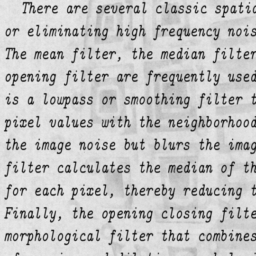

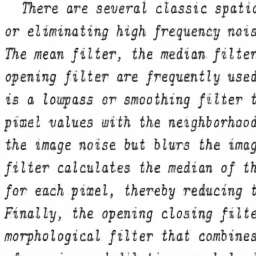

2021-08-04 20:25:11.780943 Epoch 140, Training loss 0.0008174571278505027


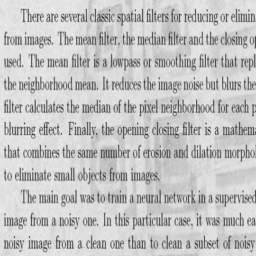

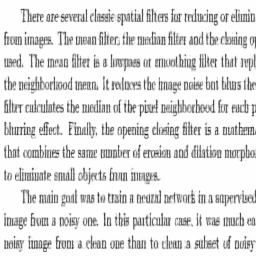

2021-08-04 20:25:18.217198 Epoch 150, Training loss 0.0008119992539286614


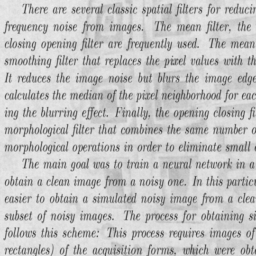

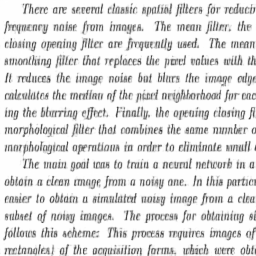

2021-08-04 20:25:24.629954 Epoch 160, Training loss 0.0007982178288511932


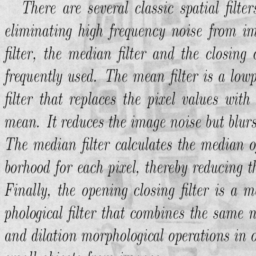

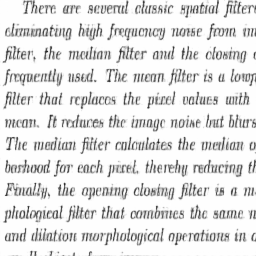

2021-08-04 20:25:31.056631 Epoch 170, Training loss 0.0007836261787451804


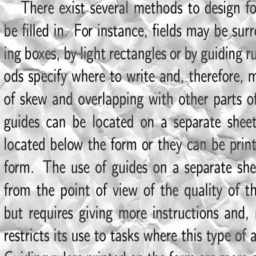

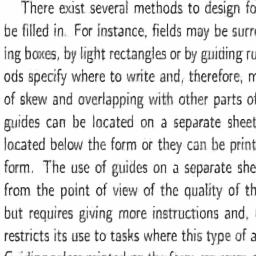

2021-08-04 20:25:37.472542 Epoch 180, Training loss 0.0007610526867210865


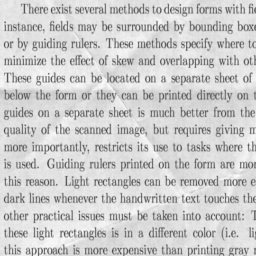

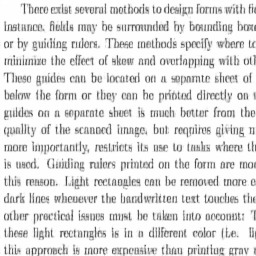

2021-08-04 20:25:43.893515 Epoch 190, Training loss 0.0007515288051217795


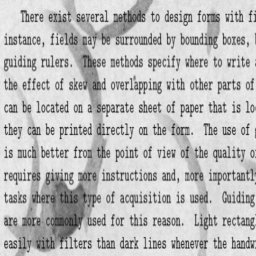

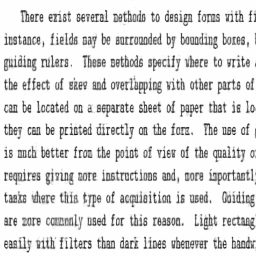

2021-08-04 20:25:50.320483 Epoch 200, Training loss 0.0007495369925163687


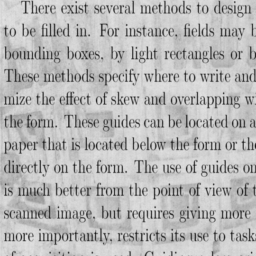

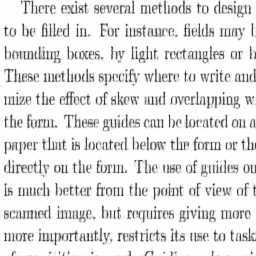

In [ ]:
errors_conv, accuracies_conv = training_loop_conv( 
    n_epochs = 200,
    optimizer = optimizer_conv,
    model = model_conv,
    loss_fn = loss_fn_conv,
    index_loader = index_loader,
    t_train = tensor_train_t,
    t_cleaned = tensor_cleaned_t,
    t_val_x = tensor_train_val,
    t_val_y = tensor_cleaned_val,
    t_test = tensor_test
    )

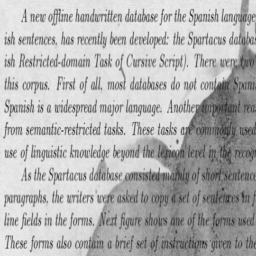

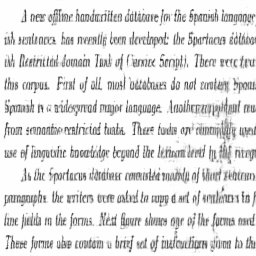

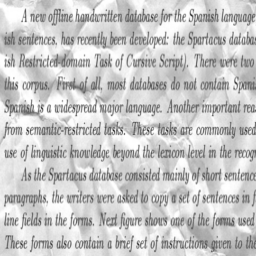

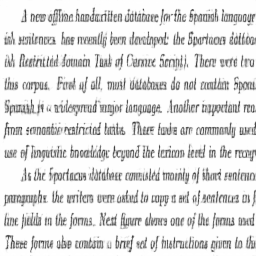

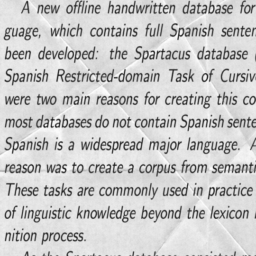

...

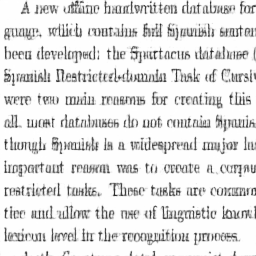

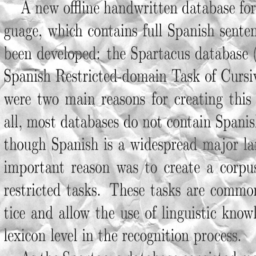

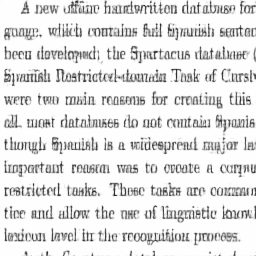

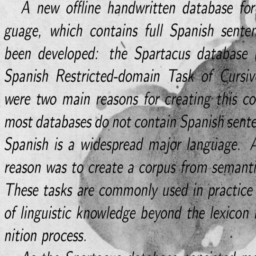

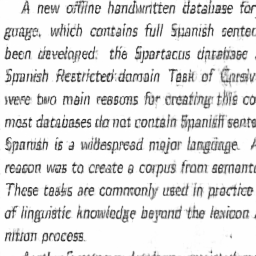

In [ ]:
tran1_tmp = transforms.ToPILImage()
for img_conv in data_test:
  display(tran1_tmp(img_conv))
  img_conv = img_conv.view(1,1,img_conv.shape[0], img_conv.shape[1]).to(device)
  out_conv = model_conv(img_conv)
  out_conv = out_conv.view(out_conv.shape[2], out_conv.shape[3]).to("cpu")
  display(tran1_tmp(out_conv))

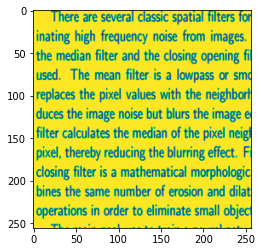

In [ ]:
img_conv = data_cleaned[10]
plt.imshow(img_conv)
plt.show()
img_conv = img_conv.view(1,1,img_conv.shape[0], img_conv.shape[1]).to(device)

In [ ]:
out_conv = model_conv(img_conv)
#out = out.view(420,540).to("cpu")
out_conv.shape

torch.Size([1, 1, 256, 256])

In [ ]:
#img = img.to("cpu")
out_conv = out_conv.view(out_conv.shape[2], out_conv.shape[3]).to("cpu")
out_conv = out_conv.detach().numpy()
plt.imshow(out_conv)